# EDA for Covid-19 Impacts

### Import Packages

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
sns.set()

### Load and Inspect Data

In [ ]:
df = pd.read_csv('raw_data.csv')

In [12]:
df.head()

,iso_code,location,date,total_cases,total_deaths,stringency_index,population,gdp_per_capita,human_development_index,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
0,AFG,Afghanistan,2019-12-31,0.0,0.0,0.0,38928341,1803.987,0.498,#NUM!,#NUM!,#NUM!,17.477233,7.497754494
1,AFG,Afghanistan,2020-01-01,0.0,0.0,0.0,38928341,1803.987,0.498,#NUM!,#NUM!,#NUM!,17.477233,7.497754494
2,AFG,Afghanistan,2020-01-02,0.0,0.0,0.0,38928341,1803.987,0.498,#NUM!,#NUM!,#NUM!,17.477233,7.497754494
3,AFG,Afghanistan,2020-01-03,0.0,0.0,0.0,38928341,1803.987,0.498,#NUM!,#NUM!,#NUM!,17.477233,7.497754494
4,AFG,Afghanistan,2020-01-04,0.0,0.0,0.0,38928341,1803.987,0.498,#NUM!,#NUM!,#NUM!,17.477233,7.497754494


In [17]:
df.shape

(50418, 14)

In [18]:
df.columns

Index(['iso_code', 'location', 'date', 'total_cases', 'total_deaths',
       'stringency_index', 'population', 'gdp_per_capita',
       'human_development_index', 'Unnamed: 9', 'Unnamed: 10', 'Unnamed: 11',
       'Unnamed: 12', 'Unnamed: 13'],
      dtype='object')

### Data Cleaning

In [21]:
df.drop('Unnamed: 9',inplace=True,axis=1)
df.drop('Unnamed: 10',inplace=True,axis=1)
df.drop('Unnamed: 11',inplace=True,axis=1)
df.drop('Unnamed: 12',inplace=True,axis=1)
df.drop('Unnamed: 13',inplace=True,axis=1)

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50418 entries, 0 to 50417
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   iso_code                 50418 non-null  object 
 1   location                 50418 non-null  object 
 2   date                     50418 non-null  object 
 3   total_cases              50418 non-null  float64
 4   total_deaths             50418 non-null  float64
 5   stringency_index         50418 non-null  float64
 6   population               50418 non-null  int64  
 7   gdp_per_capita           50418 non-null  float64
 8   human_development_index  44216 non-null  float64
dtypes: float64(5), int64(1), object(3)
memory usage: 3.5+ MB


In [42]:
df['date'] = pd.to_datetime(df['date'])

In [75]:
df['population'] = df['population'].astype('float')

In [29]:
df.isna().sum()

iso_code                       0
location                       0
date                           0
total_cases                 3094
total_deaths               11190
stringency_index            7126
population                     0
gdp_per_capita              5712
human_development_index     6202
dtype: int64

<AxesSubplot: >

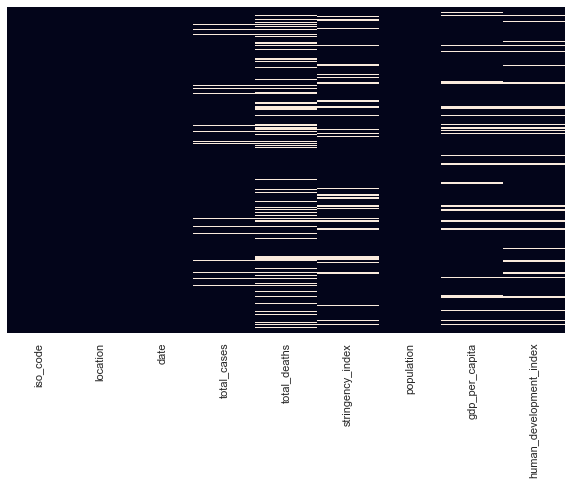

In [31]:
plt.figure(figsize=(10,6))
sns.heatmap(df.isna(),cbar=False,yticklabels=False)

In [32]:
tc_mean = df['total_cases'].mean()
df['total_cases'].fillna(tc_mean,inplace=True)

In [33]:
td_mean = df['total_deaths'].mean()
df['total_deaths'].fillna(td_mean,inplace=True)

In [36]:
si_mean = df['stringency_index'].mean()
df['stringency_index'].fillna(si_mean,inplace=True)

In [37]:
gdb_mean = df['gdp_per_capita'].mean()
df['gdp_per_capita'].fillna(gdb_mean,inplace=True)

In [39]:
df.duplicated().sum()

0

In [76]:
df.sample(5)

,iso_code,location,date,total_cases,total_deaths,stringency_index,population,gdp_per_capita,human_development_index
3114,AZE,Azerbaijan,2020-04-01,298.000000,5.000000,88.890000,10139175.0,15847.41900,0.757
6053,BES,Bonaire Sint Eustatius and Saba,2020-07-19,10.000000,2978.767819,56.162022,26221.0,20818.70624,NaN
38858,LCA,Saint Lucia,2020-06-08,19.000000,2978.767819,56.162022,183629.0,12951.83900,0.747
35481,PSE,Palestine,2020-06-20,858.000000,5.000000,80.560000,5101416.0,4449.89800,0.686
3038,AZE,Azerbaijan,2020-01-16,66219.274702,2978.767819,0.000000,10139175.0,15847.41900,0.757


### EDA

In [44]:
df.describe().round(1)

,total_cases,total_deaths,stringency_index,population,gdp_per_capita,human_development_index
count,50418.0,50418.0,50418.0,5.041800e+04,50418.0,44216.0
mean,66219.3,2978.8,56.2,4.251601e+07,20818.7,0.7
std,391948.1,12204.9,25.5,1.564607e+08,19248.6,0.2
min,0.0,0.0,0.0,8.090000e+02,661.2,0.0
25%,148.0,18.0,41.7,1.399491e+06,6253.1,0.6
50%,2057.5,200.0,56.2,8.278737e+06,16409.3,0.8
75%,28710.8,2978.8,76.4,2.913681e+07,27936.9,0.8
max,8154595.0,219674.0,100.0,1.439324e+09,116935.6,1.0


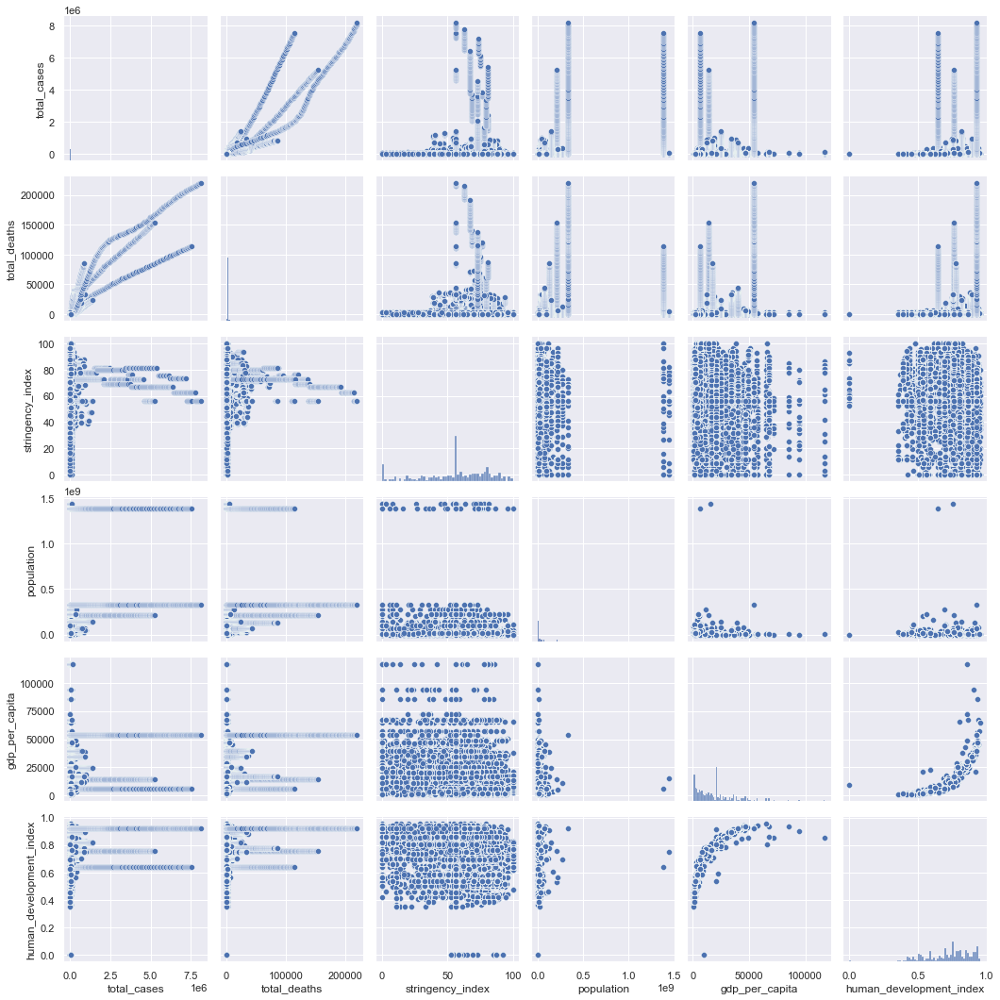

In [53]:
sns.pairplot(df,palette='coolwarm')

<AxesSubplot: title={'center': 'Total Cases Distribution'}, xlabel='total_cases'>

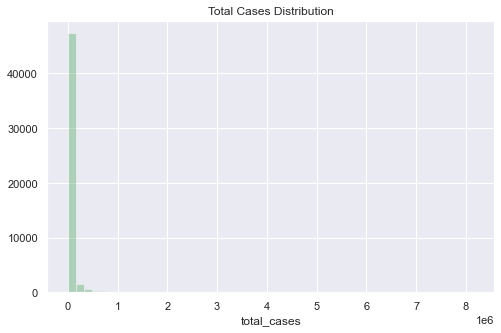

In [64]:
plt.figure(figsize=(8,5))
plt.title('Total Cases Distribution')
sns.distplot(df['total_cases'],bins=50,kde=False,color='g')

<AxesSubplot: title={'center': 'Total Deaths Distribution'}, xlabel='total_deaths'>

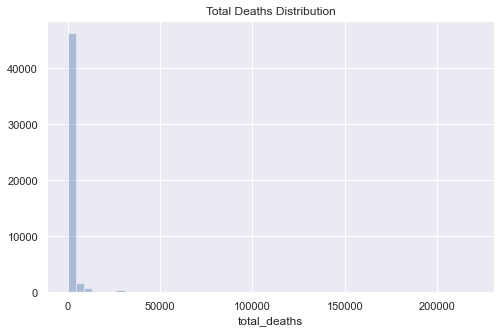

In [65]:
plt.figure(figsize=(8,5))
plt.title('Total Deaths Distribution')
sns.distplot(df['total_deaths'],bins=50,kde=False)

<AxesSubplot: title={'center': 'Population Distribution'}, xlabel='population'>

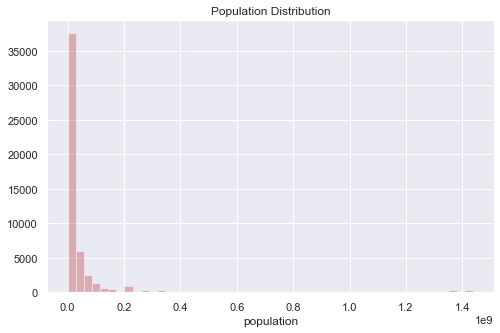

In [66]:
plt.figure(figsize=(8,5))
plt.title('Population Distribution')
sns.distplot(df['population'],bins=50,kde=False,color='r')

In [85]:
df.groupby(df['location'])['total_deaths','total_cases','population'].sum().sort_values(by=['population'],ascending=False).head(10)

,total_deaths,total_cases,population
location,,,
China,1.099705e+06,2.163232e+07,4.231612e+11
India,7.464777e+06,4.098244e+08,4.057213e+11
United States,2.665928e+07,7.474047e+08,9.731478e+10
Indonesia,1.133561e+06,2.613928e+07,8.041594e+10
Pakistan,1.027858e+06,4.190989e+07,6.494235e+10
Brazil,1.457291e+07,4.294790e+08,6.249247e+10
Nigeria,3.756895e+05,1.074272e+07,6.060504e+10
Russia,2.390724e+06,1.350080e+08,4.290473e+10
Bangladesh,5.411306e+05,3.606081e+07,3.804325e+10


In [86]:
df.groupby(df['location'])['total_deaths','total_cases','population'].sum().sort_values(by=['population'],ascending=False).tail(10)

,total_deaths,total_cases,population
location,,,
Liechtenstein,198.000000,86104.274702,8542688.0
Turks and Caicos Islands,36221.213827,44432.000000,8092062.0
Gibraltar,637456.313246,45340.000000,7209874.0
British Virgin Islands,71673.427654,4605.000000,6259059.0
Bonaire Sint Eustatius and Saba,494523.457938,5080.000000,5270421.0
Anguilla,616604.938513,614.000000,3105414.0
Solomon Islands,11915.071276,11.000000,2747512.0
Montserrat,107412.641481,68602.274702,1064787.0
Falkland Islands,592774.795962,2467.000000,693117.0


In [91]:
px.scatter(data_frame=df,x='population',y='gdp_per_capita',title='Population VS gdp_per_capita')

In [93]:
px.scatter(data_frame=df,x='human_development_index',y='gdp_per_capita',title='human_development_index VS gdp_per_capita')

In [94]:
px.scatter(data_frame=df,x='human_development_index',y='population',title='human_development_index VS population')

In [97]:
px.scatter(data_frame=df,x='human_development_index',y='total_cases',title='human_development_index VS total_cases')

<AxesSubplot: xlabel='date', ylabel='total_cases'>

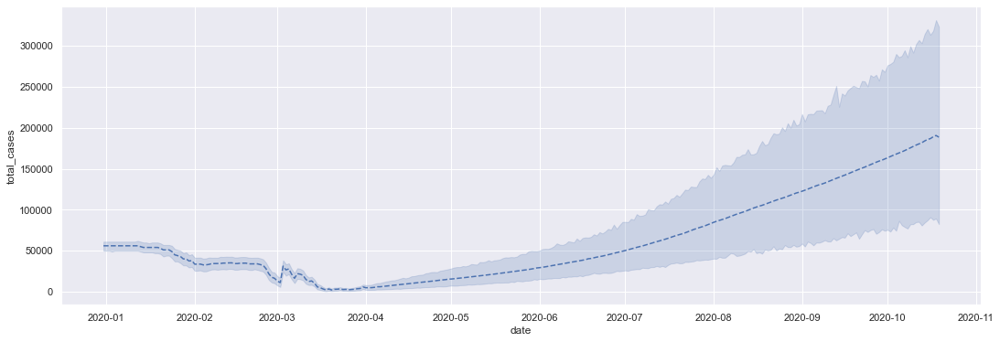

In [101]:
plt.figure(figsize=(18,6))
sns.lineplot(data=df,x='date',y='total_cases',palette='Set1',linestyle='--')

<AxesSubplot: xlabel='date', ylabel='total_deaths'>

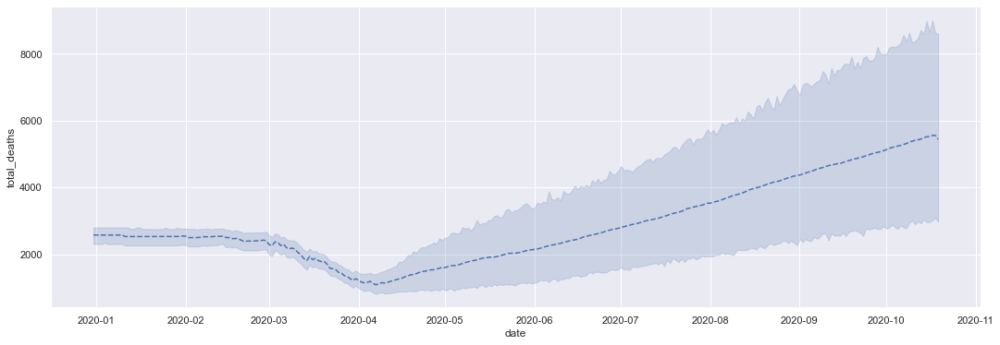

In [102]:
plt.figure(figsize=(18,6))
sns.lineplot(data=df,x='date',y='total_deaths',palette='coolwarm',linestyle='--')

Text(0.5, 1.0, 'Correlation Matrix: Stringency Index, Total Cases, Total Deaths')

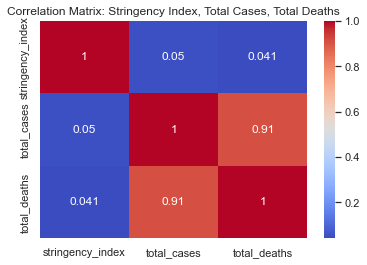

In [119]:
correlation_df = df[['stringency_index', 'total_cases', 'total_deaths']]
correlation_matrix = correlation_df.corr()

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix: Stringency Index, Total Cases, Total Deaths')

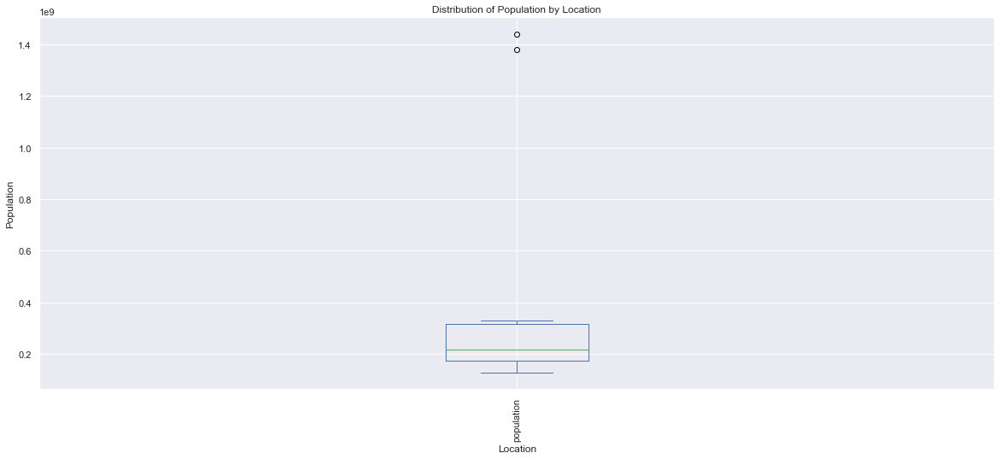

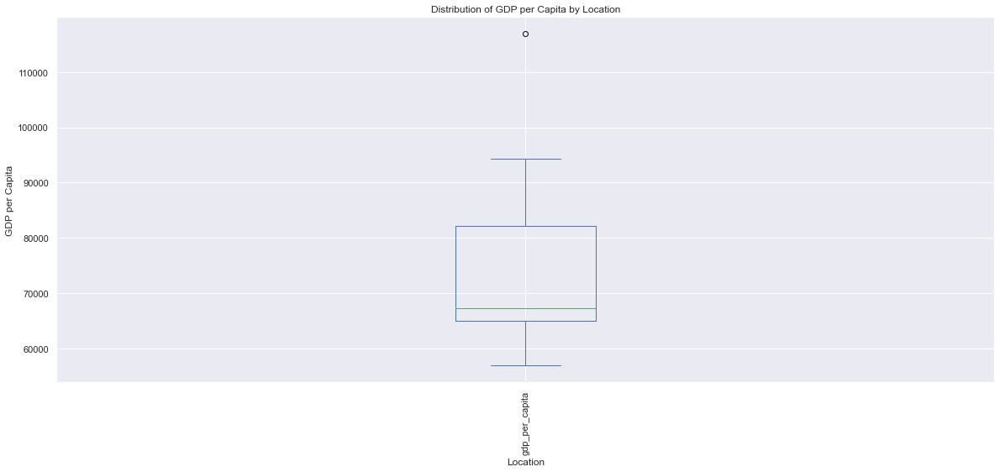

In [134]:
top_locations_pop = df.groupby('location').max()['population'].sort_values(ascending=False).head(10)
top_locations_pop.plot(kind='box',figsize=(20,8))
plt.xlabel('Location')
plt.ylabel('Population')
plt.title('Distribution of Population by Location')
plt.xticks(rotation=90)
plt.show()

top_locations_gdb = df.groupby('location').max()['gdp_per_capita'].sort_values(ascending=False).head(10)
top_locations_gdb.plot(kind='box',figsize=(20,8))
plt.xlabel('Location')
plt.ylabel('GDP per Capita')
plt.title('Distribution of GDP per Capita by Location')
plt.xticks(rotation=90)
plt.show()

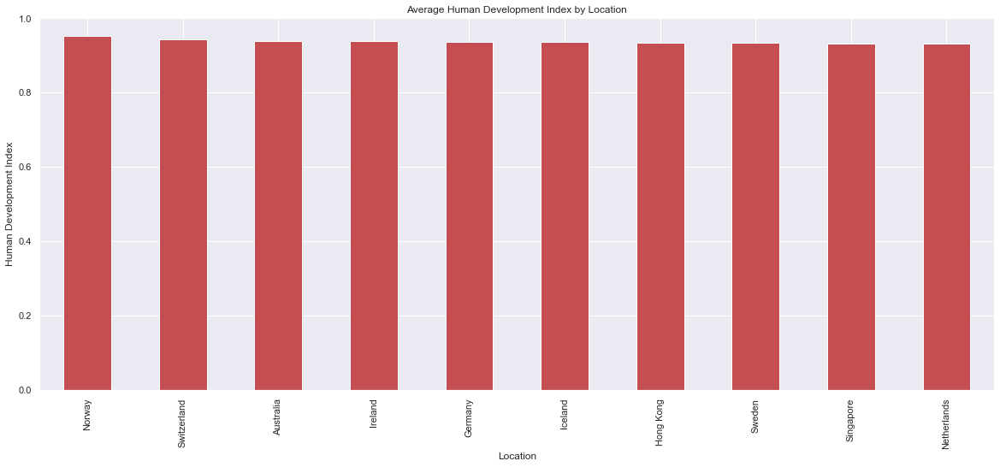

In [140]:
top_locations_hdi = df.groupby('location').mean()['human_development_index'].sort_values(ascending=False).head(10)
top_locations_hdi.plot(kind='bar',figsize=(20,8),color='r')
plt.xlabel('Location')
plt.ylabel('Human Development Index')
plt.title('Average Human Development Index by Location')
plt.show()

<AxesSubplot: >

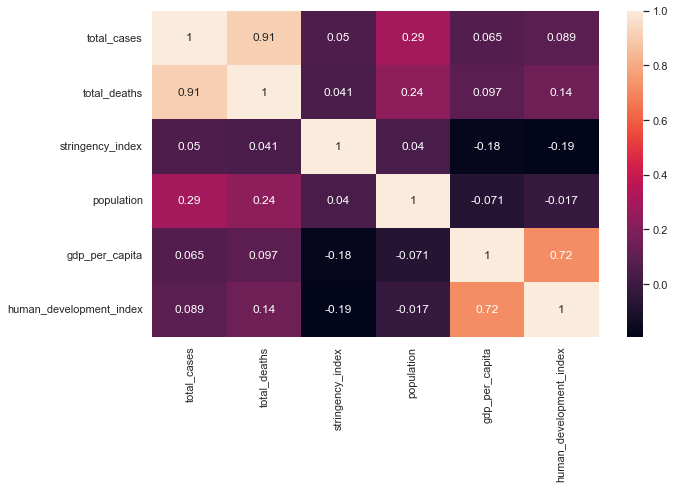

In [103]:
plt.figure(figsize=(10,6))
sns.heatmap(df.corr(),annot=True)

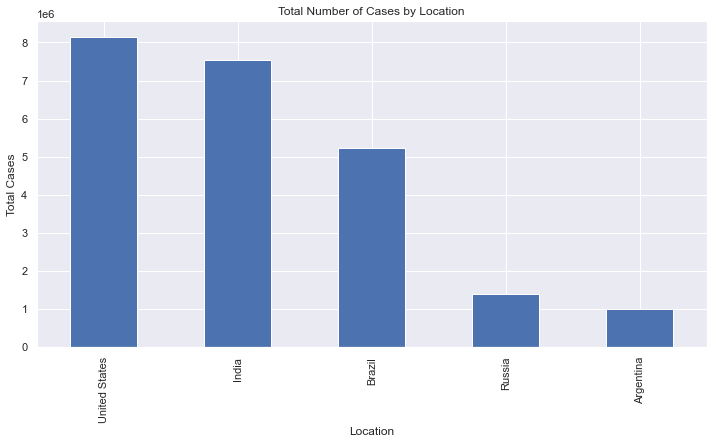

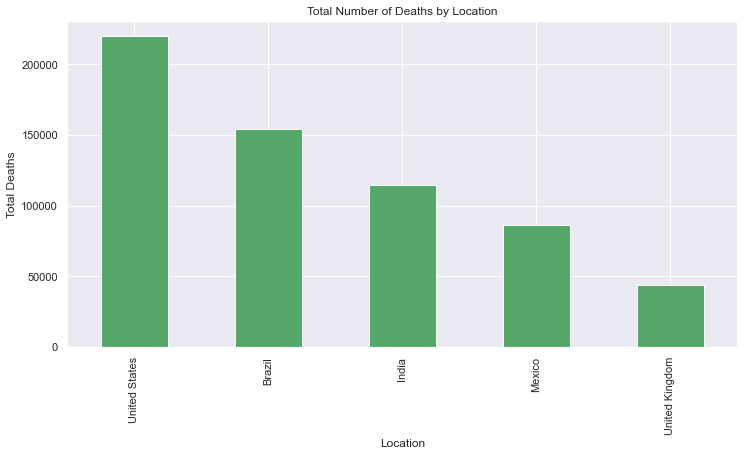

In [112]:
plt.figure(figsize=(12, 6))
df.groupby('location')['total_cases'].max().sort_values(ascending=False).head(5).plot(kind='bar')
plt.xlabel('Location')
plt.ylabel('Total Cases')
plt.title('Total Number of Cases by Location')
plt.show()

plt.figure(figsize=(12, 6))
df.groupby('location')['total_deaths'].max().sort_values(ascending=False).head(5).plot(kind='bar',color='g')
plt.xlabel('Location')
plt.ylabel('Total Deaths')
plt.title('Total Number of Deaths by Location')
plt.show()

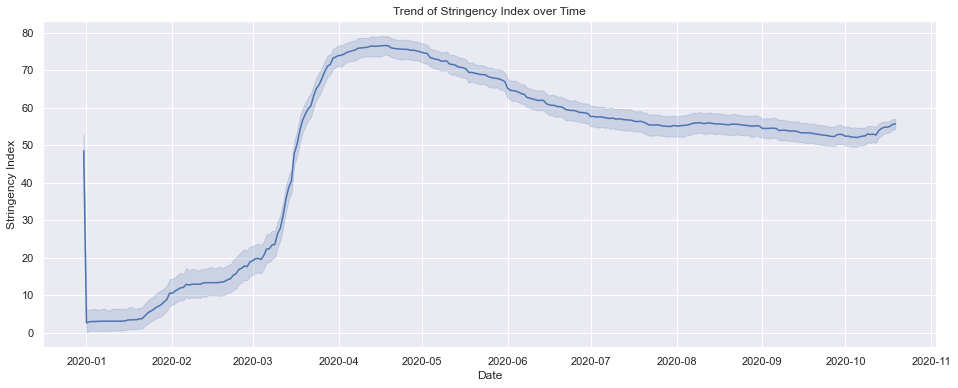

In [115]:
plt.figure(figsize=(16, 6))
sns.lineplot(data=df,x='date', y='stringency_index')
plt.xlabel('Date')
plt.ylabel('Stringency Index')
plt.title('Trend of Stringency Index over Time')
plt.show()

# 